In [4]:
%pip install wordcloud

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.3/548.3 kB 3.6 MB/s eta 0:00:00m eta 0:00:010:00:01
Note: you may need to restart the kernel to use updated packages.


In [6]:
%pip install textblob

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 2.3 MB/s eta 0:00:00 MB/s eta 0:00:01:01m
Note: you may need to restart the kernel to use updated packages.


In [8]:
%pip install cufflinks

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.7/81.7 kB 1.2 MB/s eta 0:00:00 MB/s eta 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=67900 sha256=7b2f79fcac0c9af1226b668c0fc379efdfb508e13cb91b3d924256dcbea4ae9c
  Stored in directory: /home/faiz/.cache/pip/wheels/c3/bf/8f/afa0730b29e347e8c1071049f89748c1262e7a14a838820ae6
Successfully built cufflinks
Note: you may need to restart the kernel to use updated packages.


In [9]:
import pandas as pd 
import numpy as np 


#NLTK libraries
import nltk
import re
import string
from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer

# Machine Learning libraries
import sklearn 
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import svm, datasets
from sklearn import preprocessing 


#Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

#Visualization libraries
import matplotlib.pyplot as plt 
from matplotlib import rcParams
import seaborn as sns
from textblob import TextBlob
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot
%matplotlib inline

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Other miscellaneous libraries
from scipy import interp
from itertools import cycle
import cufflinks as cf
from collections import defaultdict
from collections import Counter
from imblearn.over_sampling import SMOTE

In [2]:
con = sqlite3.connect("dataset/flipkart_products.db")
items = pd.read_sql_query("SELECT * from items", con)
items.to_csv('dataset/reviews.csv')
con.close()

In [10]:
raw_reviews = pd.read_csv('dataset/Musical_instruments_reviews.csv')

In [11]:
raw_reviews.shape

(10261, 9)

In [12]:
raw_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10261 entries, 0 to 10260
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   reviewerID      10261 non-null  object 
 1   asin            10261 non-null  object 
 2   reviewerName    10234 non-null  object 
 3   helpful         10261 non-null  object 
 4   reviewText      10254 non-null  object 
 5   overall         10261 non-null  float64
 6   summary         10261 non-null  object 
 7   unixReviewTime  10261 non-null  int64  
 8   reviewTime      10261 non-null  object 
dtypes: float64(1), int64(1), object(7)
memory usage: 721.6+ KB


In [13]:
raw_reviews.head()

,reviewerID,asin,reviewerName,helpful,reviewText,overall,summary,unixReviewTime,reviewTime
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]","Not much to write about here, but it does exac...",5.0,good,1393545600,"02 28, 2014"
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",The product does exactly as it should and is q...,5.0,Jake,1363392000,"03 16, 2013"
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",The primary job of this device is to block the...,5.0,It Does The Job Well,1377648000,"08 28, 2013"
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",Nice windscreen protects my MXL mic and preven...,5.0,GOOD WINDSCREEN FOR THE MONEY,1392336000,"02 14, 2014"
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",This pop filter is great. It looks and perform...,5.0,No more pops when I record my vocals.,1392940800,"02 21, 2014"


In [14]:
process_reviews=raw_reviews.copy()
process_reviews.isnull().sum()

reviewerID         0
asin               0
reviewerName      27
helpful            0
reviewText         7
overall            0
summary            0
unixReviewTime     0
reviewTime         0
dtype: int64

In [15]:
process_reviews['reviewText']=process_reviews['reviewText'].fillna('Missing')

In [16]:
process_reviews['reviews']=process_reviews['reviewText']+process_reviews['summary']
process_reviews=process_reviews.drop(['reviewText', 'summary'], axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac..."
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...


In [17]:
process_reviews['overall'].value_counts()

overall
5.0    6938
4.0    2084
3.0     772
2.0     250
1.0     217
Name: count, dtype: int64

In [18]:
def f(row):
    if row['overall'] == 3.0:
        val = 'Neutral'
    elif row['overall'] == 1.0 or row['overall'] == 2.0:
        val = 'Negative'
    elif row['overall'] == 4.0 or row['overall'] == 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [19]:
process_reviews['sentiment'] = process_reviews.apply(f, axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviewTime,reviews,sentiment
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"02 28, 2014","Not much to write about here, but it does exac...",Positive
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,"03 16, 2013",The product does exactly as it should and is q...,Positive
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,"08 28, 2013",The primary job of this device is to block the...,Positive
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,"02 14, 2014",Nice windscreen protects my MXL mic and preven...,Positive
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,"02 21, 2014",This pop filter is great. It looks and perform...,Positive


In [20]:
process_reviews['sentiment'].value_counts()

sentiment
Positive    9022
Neutral      772
Negative     467
Name: count, dtype: int64

In [21]:
new = process_reviews["reviewTime"].str.split(",", n = 1, expand = True) 
process_reviews["date"]= new[0] 
process_reviews["year"]= new[1] 
process_reviews=process_reviews.drop(['reviewTime'], axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviews,sentiment,date,year
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"Not much to write about here, but it does exac...",Positive,02 28,2014
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,The product does exactly as it should and is q...,Positive,03 16,2013
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,The primary job of this device is to block the...,Positive,08 28,2013
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,Positive,02 14,2014
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,This pop filter is great. It looks and perform...,Positive,02 21,2014


In [22]:
new1 = process_reviews["date"].str.split(" ", n = 1, expand = True) 
process_reviews["month"]= new1[0] 
process_reviews["day"]= new1[1] 
process_reviews=process_reviews.drop(['date'], axis=1)
process_reviews.head()

,reviewerID,asin,reviewerName,helpful,overall,unixReviewTime,reviews,sentiment,year,month,day
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...","[0, 0]",5.0,1393545600,"Not much to write about here, but it does exac...",Positive,2014,02,28
1,A14VAT5EAX3D9S,1384719342,Jake,"[13, 14]",5.0,1363392000,The product does exactly as it should and is q...,Positive,2013,03,16
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""","[1, 1]",5.0,1377648000,The primary job of this device is to block the...,Positive,2013,08,28
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""","[0, 0]",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,Positive,2014,02,14
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,"[0, 0]",5.0,1392940800,This pop filter is great. It looks and perform...,Positive,2014,02,21


In [23]:
new1 = process_reviews["helpful"].str.split(",", n = 1, expand = True)
new2 = new1[0].str.split("[", n = 1, expand = True)
new3 = new1[1].str.split("]", n = 1, expand = True)
new2.reset_index(drop=True, inplace=True)
new3.reset_index(drop=True, inplace=True)
new2=new2.drop([0], axis=1)
new3=new3.drop([1], axis=1)
helpful=pd.concat([new2, new3], axis=1)


def trim_all_columns(df):
    trim_strings = lambda x: x.strip() if isinstance(x, str) else x
    return df.applymap(trim_strings)


helpful= trim_all_columns(helpful)
helpful[0]=helpful[0].astype(str).astype(int)
helpful[1]=helpful[1].astype(str).astype(int)


try:
  helpful['result'] = helpful[1]/helpful[0]
except ZeroDivisionError:
  helpful['result']=0


helpful['result'] = helpful['result'].fillna(0)
helpful['result']=helpful['result'].round(2) 
process_reviews['helpful_rate']=helpful['result']
process_reviews=process_reviews.drop(['helpful'], axis=1)

In [24]:
process_reviews.head()

,reviewerID,asin,reviewerName,overall,unixReviewTime,reviews,sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,"cassandra tu ""Yeah, well, that's just like, u...",5.0,1393545600,"Not much to write about here, but it does exac...",Positive,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,Jake,5.0,1363392000,The product does exactly as it should and is q...,Positive,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,"Rick Bennette ""Rick Bennette""",5.0,1377648000,The primary job of this device is to block the...,Positive,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,"RustyBill ""Sunday Rocker""",5.0,1392336000,Nice windscreen protects my MXL mic and preven...,Positive,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,SEAN MASLANKA,5.0,1392940800,This pop filter is great. It looks and perform...,Positive,2014,02,21,0.00


In [25]:
process_reviews['helpful_rate'].value_counts()

helpful_rate
0.00    7215
1.00    2040
0.50     266
0.67     136
0.75     111
0.80      44
0.33      33
0.88      25
0.60      24
0.86      24
0.92      22
0.89      20
0.94      20
0.83      19
0.25      19
0.93      18
0.97      18
0.95      17
0.90      15
0.96      15
0.91      14
0.71      13
0.98      10
0.78      10
0.82       8
0.85       7
0.57       6
0.40       6
0.62       5
0.79       5
0.99       4
0.81       4
0.70       4
0.87       4
0.76       3
0.84       3
0.17       3
0.64       3
0.12       3
0.11       3
0.20       3
0.29       3
0.09       3
0.73       3
0.26       2
0.14       2
0.07       2
0.05       2
0.08       2
0.55       2
0.77       2
0.58       2
0.44       2
0.31       1
0.47       1
0.22       1
0.10       1
0.46       1
0.30       1
0.65       1
0.56       1
0.15       1
0.13       1
0.43       1
0.69       1
Name: count, dtype: int64

In [26]:
process_reviews=process_reviews.drop(['reviewerName','unixReviewTime'], axis=1)
clean_reviews=process_reviews.copy()

In [27]:
def review_cleaning(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [28]:
process_reviews['reviews']=process_reviews['reviews'].apply(lambda x:review_cleaning(x))
process_reviews.head()

,reviewerID,asin,overall,reviews,sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,not much to write about here but it does exact...,Positive,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,the product does exactly as it should and is q...,Positive,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,the primary job of this device is to block the...,Positive,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,nice windscreen protects my mxl mic and preven...,Positive,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,this pop filter is great it looks and performs...,Positive,2014,02,21,0.00


In [29]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english"))
print(f"Stop Words in English : \n{ stop_words}")

Stop Words in English : 
{'hasn', 'ourselves', 'for', 'i', 'too', 'am', 'shan', 'such', "needn't", 'on', 'these', 'yourselves', 'mightn', 'during', 'to', 'him', 'can', 've', 'hadn', 'yourself', 'between', 'shouldn', "weren't", 'weren', 'until', "mightn't", 'once', 'why', 'will', 'are', 'under', "wasn't", 'it', 'been', 'do', 'ours', 'about', 'where', 'they', 'up', 'you', 'down', 'needn', 'wasn', 'and', "hadn't", 'hers', 'mustn', 'a', 'just', 'through', 'those', "isn't", 'being', 'haven', "aren't", 'only', 'if', "haven't", 'below', 'while', 'won', 'few', 'most', 'with', 'again', 'doing', "that'll", 'myself', 'herself', 'an', 'ma', 'she', "didn't", 'didn', 'have', 'ain', 'y', 'its', 'no', 'at', 'himself', 'or', 'any', "it's", 'by', 'into', 'all', 'both', 'we', 'd', 'off', "mustn't", 'my', 'should', "you're", 'our', "she's", 'than', 'more', "don't", 'same', 'so', 's', "wouldn't", 'who', 'isn', 'but', 'not', 'which', "couldn't", 'in', 'he', 'over', 'yours', 'whom', 'when', 'couldn', 'll', '

In [30]:
process_reviews['reviews'] = process_reviews['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
process_reviews.head()

,reviewerID,asin,overall,reviews,sentiment,year,month,day,helpful_rate
0,A2IBPI20UZIR0U,1384719342,5.0,much write exactly supposed filters pop sounds...,Positive,2014,02,28,0.00
1,A14VAT5EAX3D9S,1384719342,5.0,product exactly quite affordablei realized dou...,Positive,2013,03,16,0.93
2,A195EZSQDW3E21,1384719342,5.0,primary job device block breath would otherwis...,Positive,2013,08,28,1.00
3,A2C00NNG1ZQQG2,1384719342,5.0,nice windscreen protects mxl mic prevents pops...,Positive,2014,02,14,0.00
4,A94QU4C90B1AX,1384719342,5.0,pop filter great looks performs like studio fi...,Positive,2014,02,21,0.00


In [31]:
pd.DataFrame(process_reviews.groupby('sentiment')['helpful_rate'].mean())

,helpful_rate
sentiment,
Negative,0.307559
Neutral,0.275687
Positive,0.260505


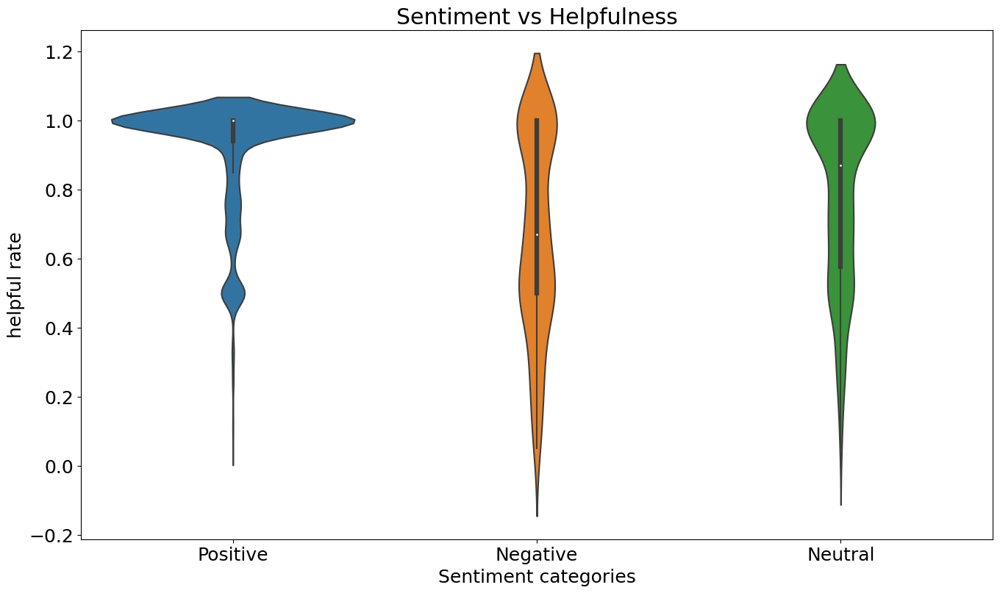

In [32]:
plt.rcParams.update({'font.size': 18})
rcParams['figure.figsize'] = 16,9

senti_help= pd.DataFrame(process_reviews, columns = ['sentiment', 'helpful_rate'])
senti_help = senti_help[senti_help['helpful_rate'] != 0.00] 

sns.violinplot( x=senti_help["sentiment"], y=senti_help["helpful_rate"])
plt.title('Sentiment vs Helpfulness')
plt.xlabel('Sentiment categories')
plt.ylabel('helpful rate')
plt.show()

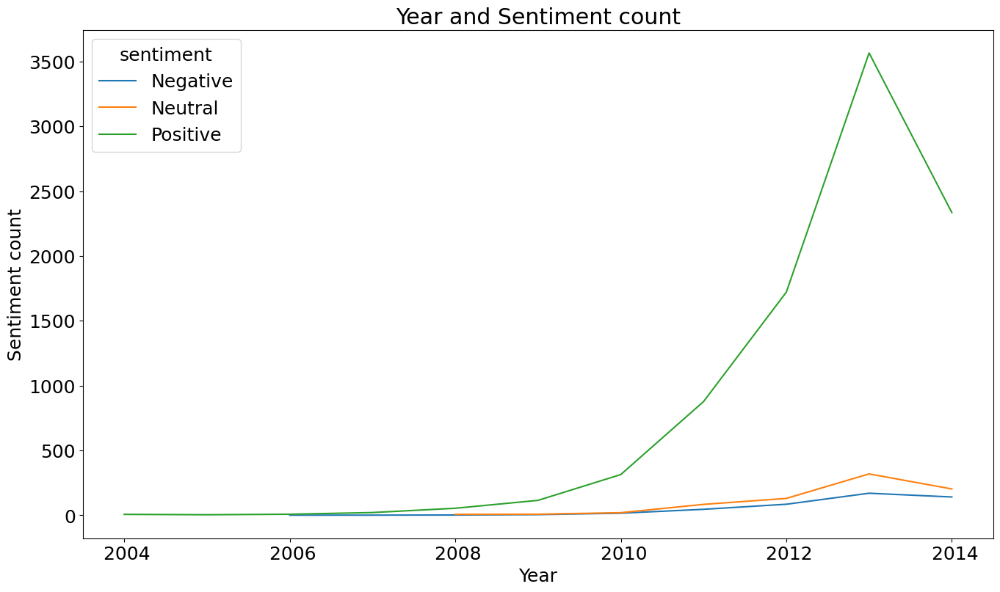

In [33]:
process_reviews.groupby(['year','sentiment'])['sentiment'].count().unstack().plot(legend=True)
plt.title('Year and Sentiment count')
plt.xlabel('Year')
plt.ylabel('Sentiment count')
plt.show()

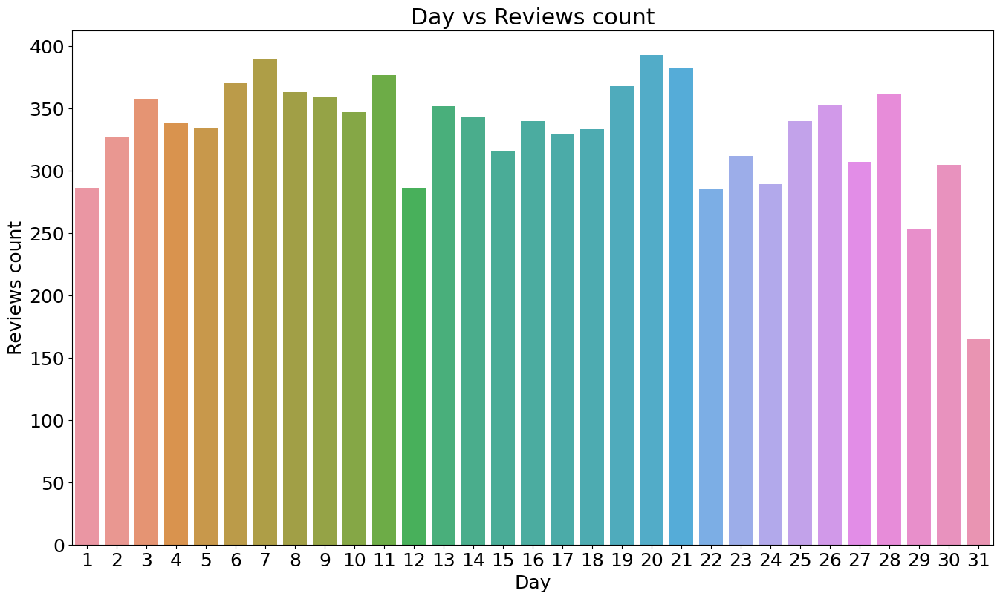

In [34]:
day=pd.DataFrame(process_reviews.groupby('day')['reviews'].count()).reset_index()
day['day']=day['day'].astype('int64')
day.sort_values(by=['day'])

#Plotting the graph
sns.barplot(x="day", y="reviews", data=day)
plt.title('Day vs Reviews count')
plt.xlabel('Day')
plt.ylabel('Reviews count')
plt.show()

In [35]:
process_reviews['polarity'] = process_reviews['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)
process_reviews['review_len'] = process_reviews['reviews'].astype(str).apply(len)
process_reviews['word_count'] = process_reviews['reviews'].apply(lambda x: len(str(x).split()))

In [36]:
process_reviews.head()

,reviewerID,asin,overall,reviews,sentiment,year,month,day,helpful_rate,polarity,review_len,word_count
0,A2IBPI20UZIR0U,1384719342,5.0,much write exactly supposed filters pop sounds...,Positive,2014,02,28,0.00,0.325000,154,23
1,A14VAT5EAX3D9S,1384719342,5.0,product exactly quite affordablei realized dou...,Positive,2013,03,16,0.93,0.014286,347,53
2,A195EZSQDW3E21,1384719342,5.0,primary job device block breath would otherwis...,Positive,2013,08,28,1.00,0.167500,309,46
3,A2C00NNG1ZQQG2,1384719342,5.0,nice windscreen protects mxl mic prevents pops...,Positive,2014,02,14,0.00,0.333333,169,22
4,A94QU4C90B1AX,1384719342,5.0,pop filter great looks performs like studio fi...,Positive,2014,02,21,0.00,0.800000,128,19


In [37]:
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

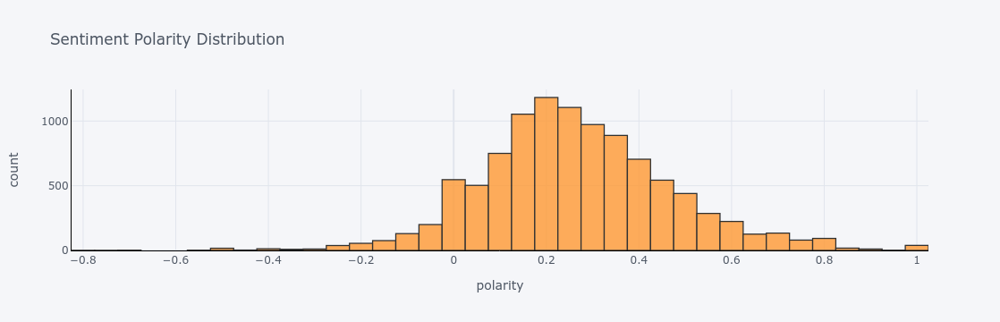

In [38]:
process_reviews['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

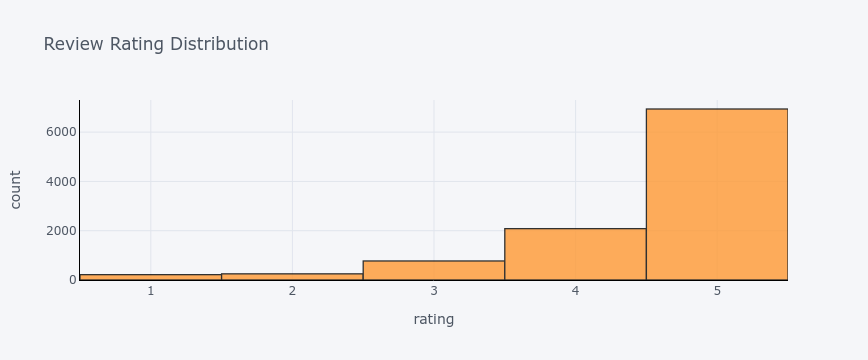

In [39]:


process_reviews['overall'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')



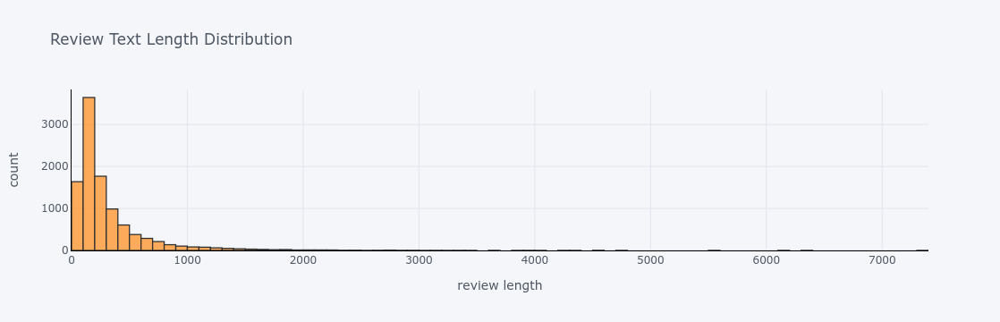

In [40]:
process_reviews['review_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    title='Review Text Length Distribution')

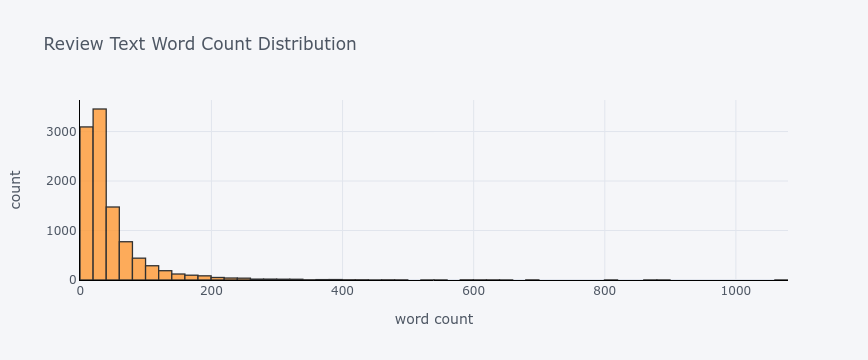

In [41]:


process_reviews['word_count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Review Text Word Count Distribution')



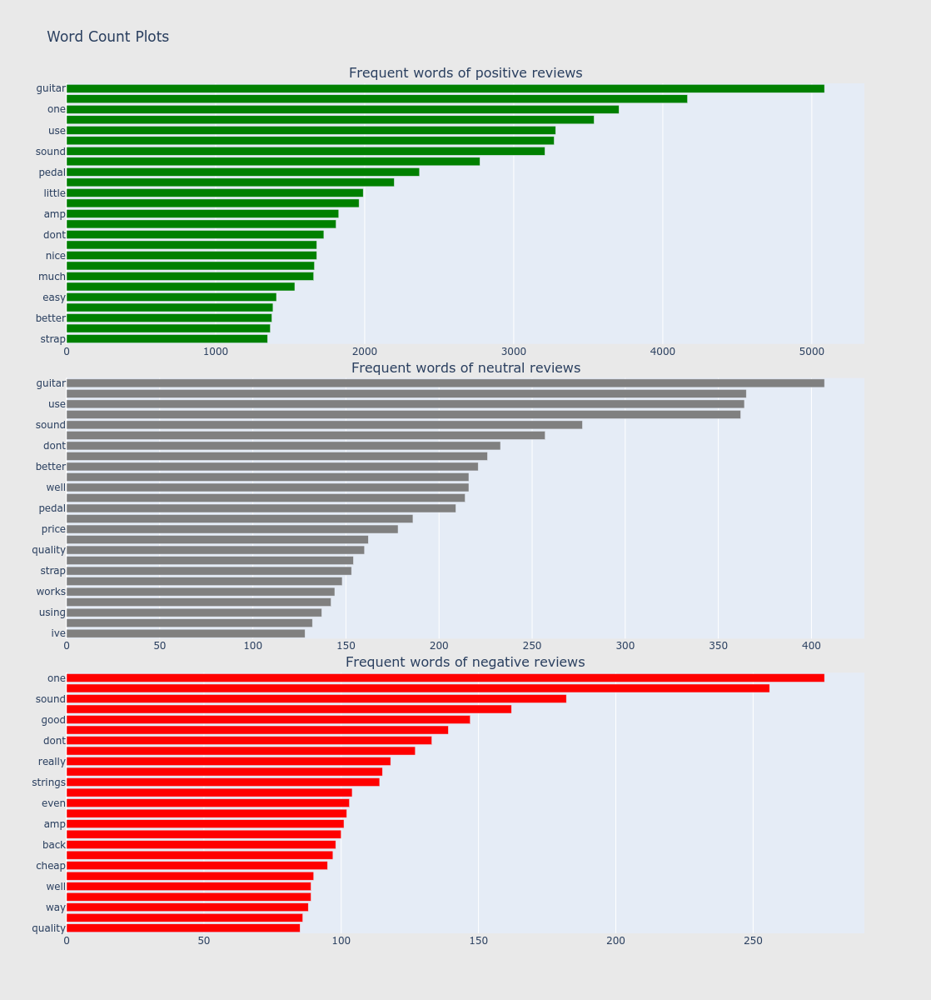

In [42]:
review_pos = process_reviews[process_reviews["sentiment"]=='Positive'].dropna()
review_neu = process_reviews[process_reviews["sentiment"]=='Neutral'].dropna()
review_neg = process_reviews[process_reviews["sentiment"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

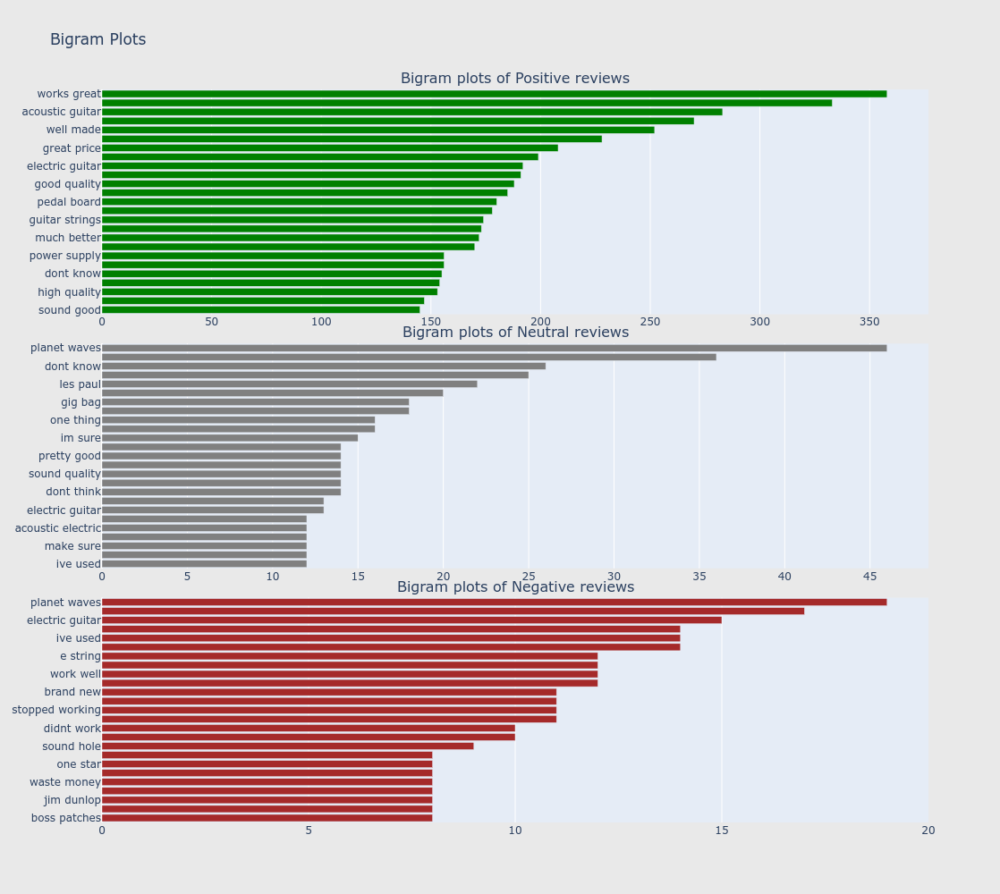

In [43]:
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'brown')



# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews", 
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews"
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Plots")
iplot(fig, filename='word-plots')

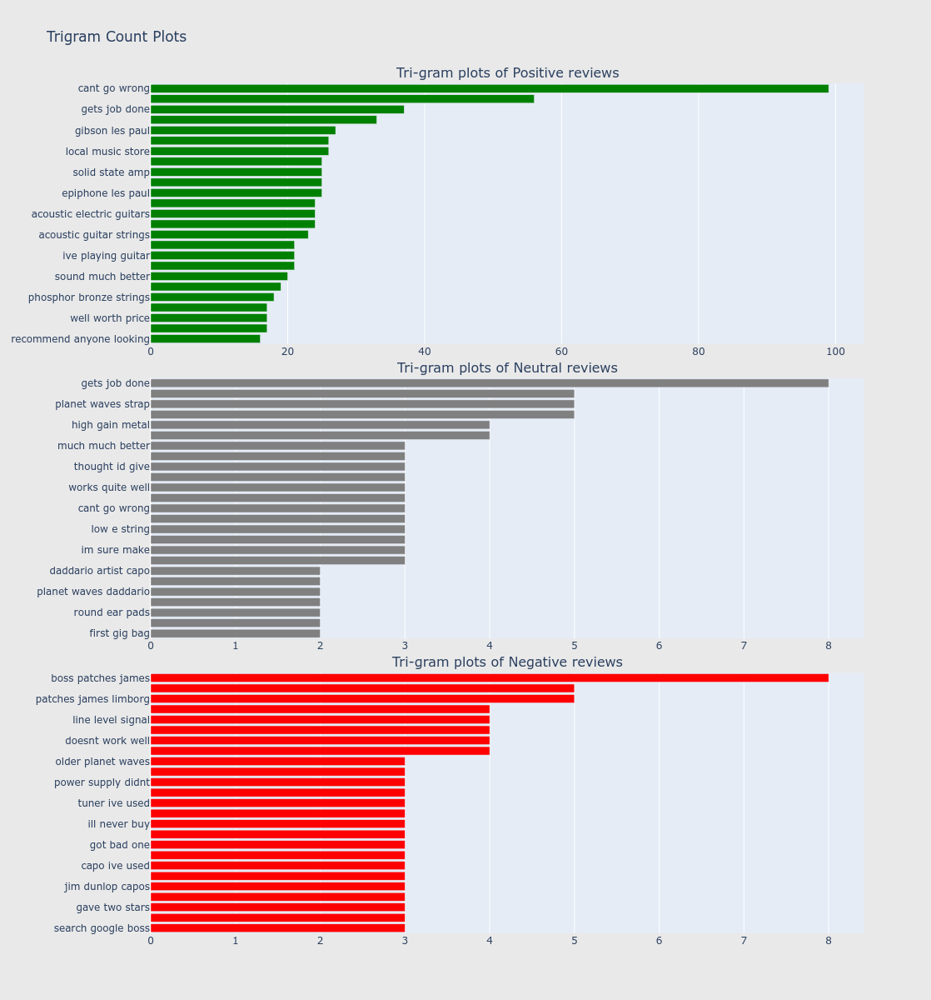

In [44]:
## Get the bar chart from positive reviews ##
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')




# Creating two subplots
fig = tools.make_subplots(rows=3, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Tri-gram plots of Positive reviews", 
                                          "Tri-gram plots of Neutral reviews",
                                          "Tri-gram plots of Negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)', title="Trigram Count Plots")
iplot(fig, filename='word-plots')

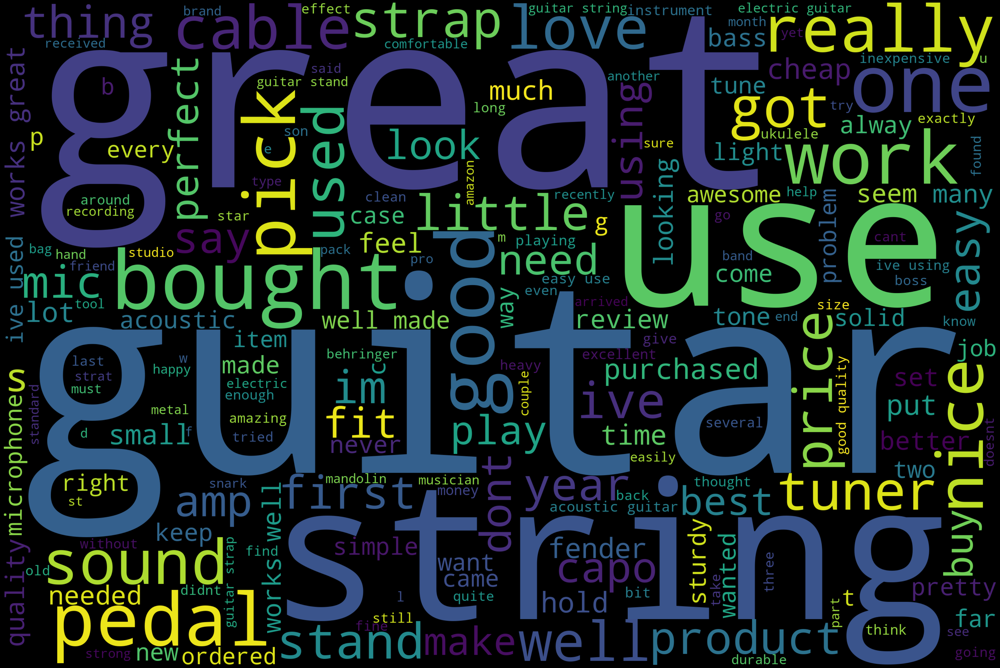

In [45]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

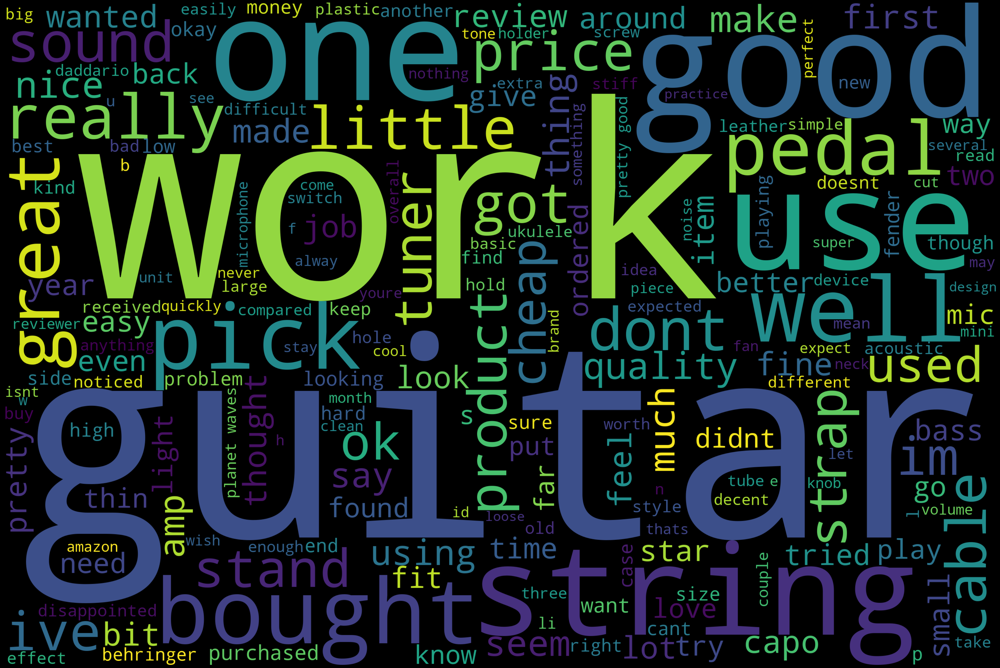

In [46]:
text = review_neu["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

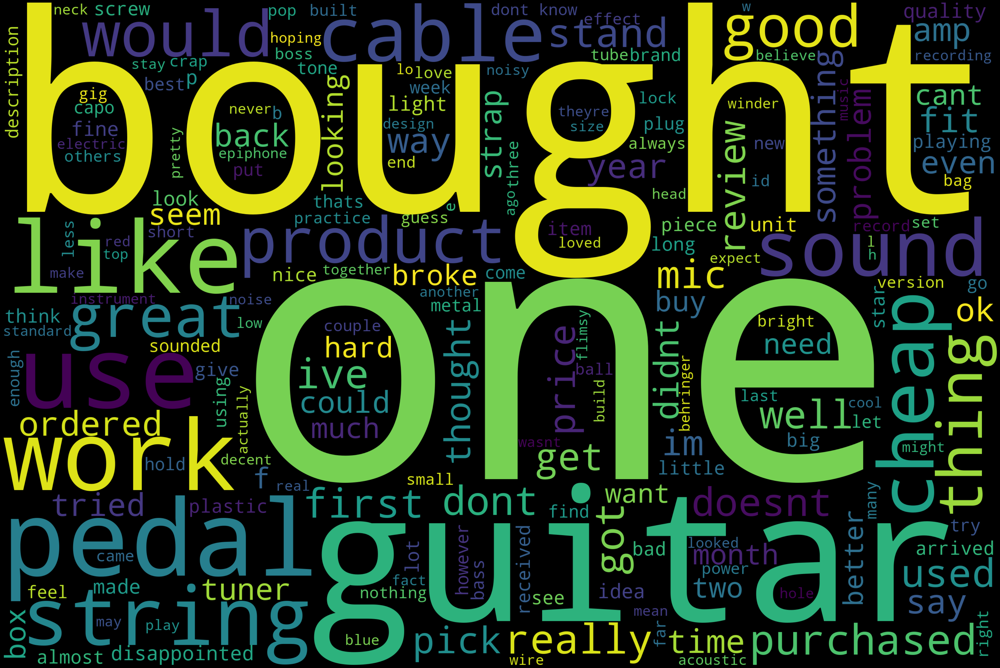

In [47]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [48]:
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'sentiment'. 
process_reviews['sentiment']= label_encoder.fit_transform(process_reviews['sentiment']) 
  
process_reviews['sentiment'].unique() 

array([2, 1, 0])

In [49]:
process_reviews['sentiment'].value_counts()

sentiment
2    9022
1     772
0     467
Name: count, dtype: int64

In [50]:
review_features=process_reviews.copy()
review_features=review_features[['reviews']].reset_index(drop=True)
review_features.head()

,reviews
0,much write exactly supposed filters pop sounds...
1,product exactly quite affordablei realized dou...
2,primary job device block breath would otherwis...
3,nice windscreen protects mxl mic prevents pops...
4,pop filter great looks performs like studio fi...


In [51]:
ps = PorterStemmer()

#splitting and adding the stemmed words except stopwords
corpus = []
for i in range(0, len(review_features)):
    review = re.sub('[^a-zA-Z]', ' ', review_features['reviews'][i])
    review = review.split()
    review = [ps.stem(word) for word in review if not word in stop_words]
    review = ' '.join(review)
    corpus.append(review) 

In [52]:
corpus[3]

'nice windscreen protect mxl mic prevent pop thing gooseneck margin abl hold screen posit requir care posit clamp avoid sagginggood windscreen money'

In [53]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000,ngram_range=(2,2))
# TF-IDF feature matrix
X= tfidf_vectorizer.fit_transform(review_features['reviews'])
y=process_reviews['sentiment']

Cross-validation
Cross-validation scores: [0.95941727 0.9531494  0.95158771 0.9573139  0.95471109]
Mean CV accuracy: 0.9552358753489146
Standard deviation of CV accuracy: 0.0028192242087384336
Classification Report for cross_val_score:
              precision    recall  f1-score   support

           0       0.97      0.94      0.95      4803
           1       0.94      0.97      0.96      4803

    accuracy                           0.96      9606
   macro avg       0.96      0.96      0.96      9606
weighted avg       0.96      0.96      0.96      9606

F1 Score: 95.59%

K-fold
Classification Report for Manual KFold:
              precision    recall  f1-score   support

           0       0.50      0.48      0.49      4803
           1       0.50      0.51      0.50      4803

    accuracy                           0.50      9606
   macro avg       0.50      0.50      0.50      9606
weighted avg       0.50      0.50      0.50      9606

F1 Score: 50.31%
K-fold scores: [0.9573361082

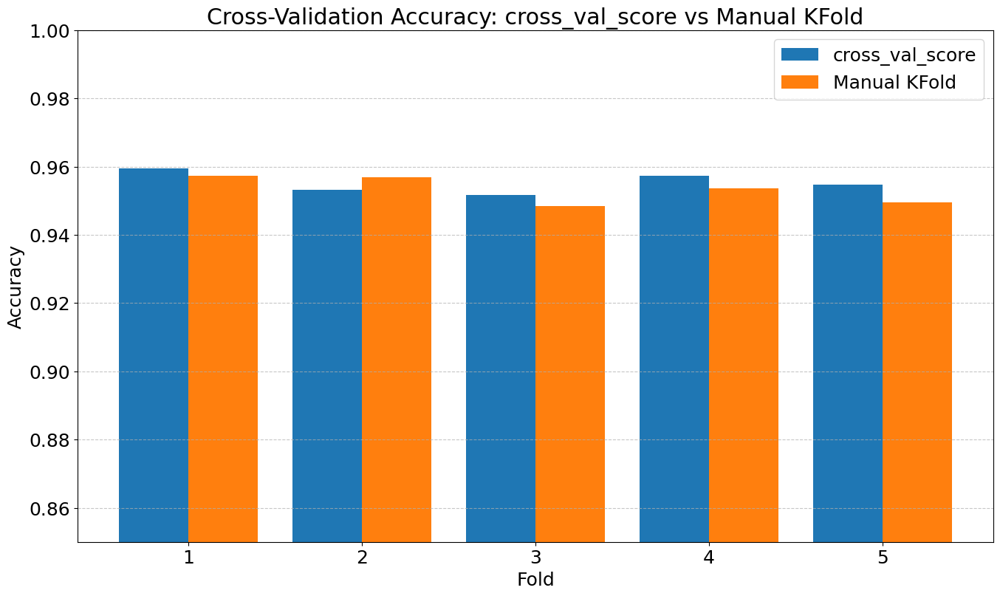

cross_val_score - Mean: 0.9552358753489146 Std Dev: 0.0028192242087384336
Manual KFold - Mean: 0.9531538431953962 Std Dev: 0.0036415853091811123


In [73]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold,cross_val_predict
from sklearn.metrics import classification_report,f1_score

logistic_regression_model = LogisticRegression()


cv_scores = cross_val_score(logistic_regression_model, X, y, cv=5)
cv_predicted = cross_val_predict(logistic_regression_model, X, y, cv=5)

print("Cross-validation")
print("Cross-validation scores:", cv_scores)
print("Mean CV accuracy:", np.mean(cv_scores))
print("Standard deviation of CV accuracy:", np.std(cv_scores))

# Classification report for cross_val_score
print("Classification Report for cross_val_score:")
print(classification_report(y, cv_predicted))
print(f"F1 Score: {round(f1_score(y, cv_predicted)*100,2)}%")

print()
print("K-fold")

kfold = KFold(n_splits=5, shuffle=True, random_state=42)
manual_kfold_scores = []
manual_kfold_predicted = []

for train_idx, test_idx in kfold.split(X):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    logistic_regression_model.fit(X_train, y_train)  # Fit on training data
    accuracy = logistic_regression_model.score(X_test, y_test)  # Calculate accuracy
    manual_kfold_scores.append(accuracy)
    y_pred = logistic_regression_model.predict(X_test)
    manual_kfold_predicted.extend(y_pred)

# Classification report for manual K-fold
print("Classification Report for Manual KFold:")
print(classification_report(y, manual_kfold_predicted))
print(f"F1 Score: {round(f1_score(y, manual_kfold_predicted)*100,2)}%")

print("K-fold scores:", manual_kfold_scores)
print("Mean k-fold accuracy:", np.mean(manual_kfold_scores))
print("Standard deviation of kfold accuracy:", np.std(manual_kfold_scores))


plt.bar([fold - 0.2 for fold in range(1, 6)], cv_scores, width=0.4, label='cross_val_score')
plt.bar([fold + 0.2 for fold in range(1, 6)], manual_kfold_scores, width=0.4, label='Manual KFold')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.title('Cross-Validation Accuracy: cross_val_score vs Manual KFold')
plt.xticks(range(1, 6))
plt.ylim(0.85, 1)  # Adjust the y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.show()

mean_cv_score = np.mean(cv_scores)
std_cv_score = np.std(cv_scores)

mean_manual_score = np.mean(manual_kfold_scores)
std_manual_score = np.std(manual_kfold_scores)

print("cross_val_score - Mean:", mean_cv_score, "Std Dev:", std_cv_score)
print("Manual KFold - Mean:", mean_manual_score, "Std Dev:", std_manual_score)


In [74]:
import joblib
spath="modelsave/"
joblib.dump(logistic_regression_model, spath+'logistic_regression_amazon.joblib')
joblib.dump(tfidf_vectorizer, spath+'tfidf_vectorizer_amazon.joblib')

['modelsave/tfidf_vectorizer_amazon.joblib']

No constraints given.
Best after iteration 1: [  8.31155935 192.97091734   0.84668448] -0.959712656161891
Best after iteration 2: [  8.31155935 192.97091734   0.84668448] -0.959712656161891
Best after iteration 3: [  8.31155935 192.97091734   0.84668448] -0.959712656161891
Best after iteration 4: [  8.31155935 192.97091734   0.84668448] -0.959712656161891
Best after iteration 5: [  8.31155935 192.97091734   0.84668448] -0.959712656161891
New best for swarm at iteration 6: [  8.57039673 219.62546073   0.67628174] -0.9598166602657197
Best after iteration 6: [  8.57039673 219.62546073   0.67628174] -0.9598166602657197
Best after iteration 7: [  8.57039673 219.62546073   0.67628174] -0.9598166602657197
Best after iteration 8: [  8.57039673 219.62546073   0.67628174] -0.9598166602657197
Best after iteration 9: [  8.57039673 219.62546073   0.67628174] -0.9598166602657197
Best after iteration 10: [  8.57039673 219.62546073   0.67628174] -0.9598166602657197
Best after iteration 11: [  8.570396

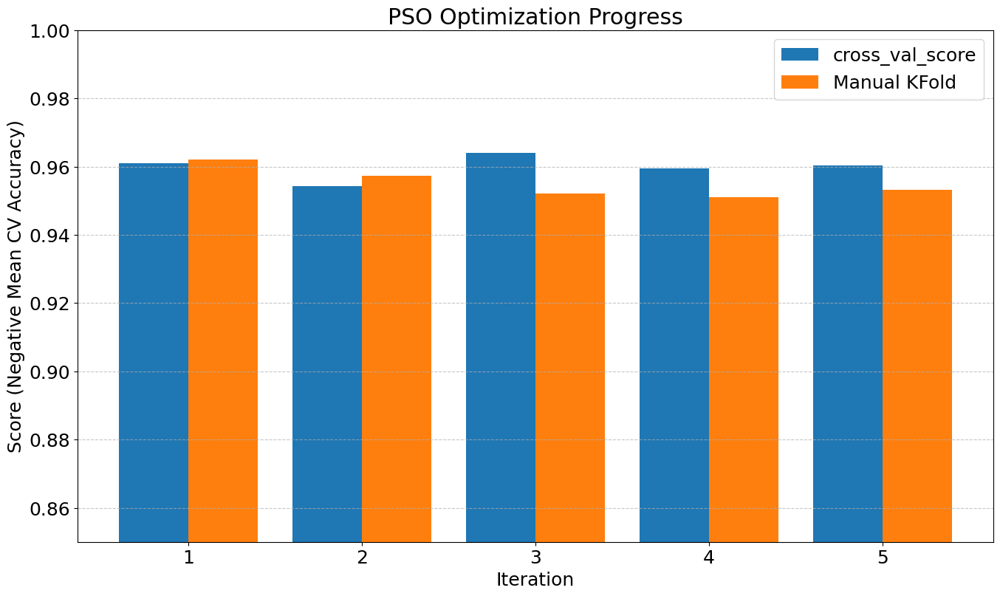

In [75]:
import torch
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from pyswarm import pso
from sklearn.metrics import classification_report


def logistic_regression_model(params):
    C = params[0]
    max_iter = int(params[1])
    solver = 'liblinear' if params[2] < 0.5 else 'lbfgs'

    model = LogisticRegression(C=C, max_iter=max_iter, solver=solver)
    scores = cross_val_score(model, X, y, cv=5)
    return -np.mean(scores)  

# PSO optimization
lb = [0.01, 50, 0]  
ub = [10, 500, 1]  
swarmsize = 15     
maxiter = 20        

# Perform PSO optimization
best_params, best_scores = pso(logistic_regression_model, lb, ub, swarmsize=swarmsize, maxiter=maxiter, debug=True)

print("Best hyperparameters:", best_params)

best_values = np.array(best_scores)  

# Train the final model with the best parameters
best_model = LogisticRegression(C=best_params[0], max_iter=int(best_params[1]), solver='liblinear' if best_params[2] < 0.5 else 'lbfgs')
cv_scores = cross_val_score(best_model, X, y, cv=5)
cv_predicted = cross_val_predict(best_model, X, y, cv=5)

kfold = KFold(n_splits=5, shuffle=True, random_state=42)
manual_kfold_scores = []
manual_kfold_predicted = []

for train_idx, test_idx in kfold.split(X):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    best_model.fit(X_train, y_train)  # Fit on training data
    accuracy = best_model.score(X_test, y_test)  # Calculate accuracy
    manual_kfold_scores.append(accuracy)
    y_pred = best_model.predict(X_test)
    manual_kfold_predicted.extend(y_pred)

print("Cross-validation")
print("Cross-validation scores after pso:", cv_scores)
print("Mean CV accuracy after pso:", np.mean(cv_scores))
print("Standard deviation of CV accuracy: after pso", np.std(cv_scores))
print("Classification Report for cross_val_score:")
print(classification_report(y, cv_predicted))
print(f"F1 Score: {round(f1_score(y, cv_predicted)*100,2)}%") 

print()
print("K-fold")
print("K-fold scores after pso:", manual_kfold_scores)
print("Mean k-fold accuracy: after pso", np.mean(manual_kfold_scores))
print("Standard deviation of kfold accuracy: after pso", np.std(manual_kfold_scores))
print("Classification Report for Manual KFold:")
print(classification_report(y, manual_kfold_predicted))
print(f"F1 Score: {round(f1_score(y, manual_kfold_predicted)*100,2)}%") 

plt.bar([iter - 0.2 for iter in range(1, 6)], cv_scores, width=0.4, label='cross_val_score')
plt.bar([iter + 0.2 for iter in range(1, 6)], manual_kfold_scores, width=0.4, label='Manual KFold')
plt.xlabel('Iteration')
plt.ylabel('Score (Negative Mean CV Accuracy)')
plt.title('PSO Optimization Progress')
plt.xticks(range(1, 6))
plt.ylim(0.85, 1)  # Adjust the y-axis limits
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()
plt.show()


In [76]:
import joblib
spath="modelsave/"
joblib.dump(best_model, spath+'best_model_pso_amazon.joblib')
joblib.dump(tfidf_vectorizer, spath+'tfidf_vectorizer_pso_amazon.joblib')

['modelsave/tfidf_vectorizer_pso_amazon.joblib']